>NAMA : M Rohmatul Mauludi
>
>KELAS : TI--3A
>
>NIM : 2141720062
>
>GITHUB : https://github.com/rudie999/PCVK/blob/main/Week11.ipynb

**LATIHAN PRAKTIKUM**

Catatan: Untuk gambar pada praktikum ini menggunakan gambar pada link berikut:
>
>
https://drive.google.com/drive/folders/1d4U8FVnQ0Hq_K1Sy4XJvQsgq12ZjvmgK?usp=sharing

1. Buka https://colab.research.google.com/. Setelah dipastikan bahwa google Colab
terhubung dengan Github Anda, buat notebook baru dan beri nama“Week11.ipynb”.
Kemudian import beberapa library dan akses folder yang ada di Drive Anda dengan
cara sebagai berikut.

In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

2. Implementasikan 6 metode template matching pada OpenCV dengan menggunakan
gambar cats_and_bunnies.jpg dan cat2_templatejpg.jpg sebagai templatenya.

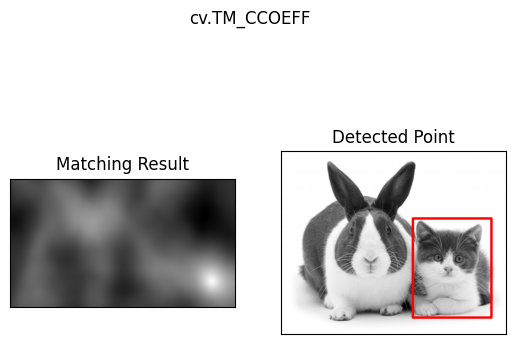

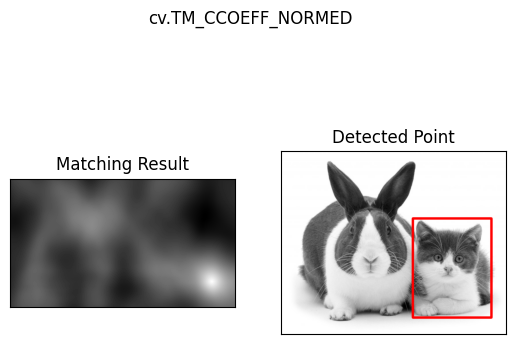

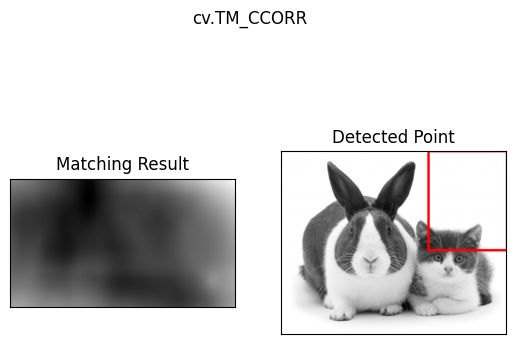

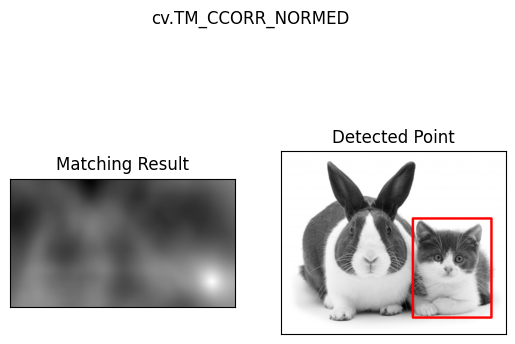

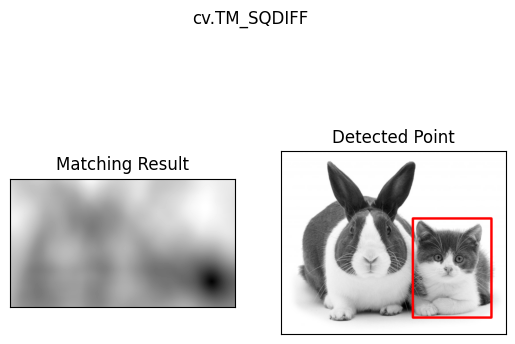

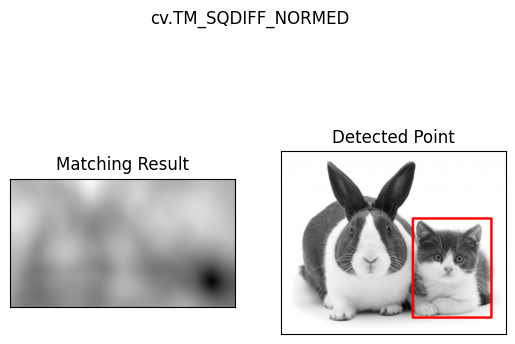

In [11]:
img = cv.imread('/content/drive/MyDrive/PCVK/Image/cats_and_bunnies.jpg', 0)
img_color = cv.cvtColor(img, cv.COLOR_GRAY2BGR)
img2 = img.copy()
template = cv.imread('/content/drive/MyDrive/PCVK/Image/cat2_templatejpg.jpg', 0)
w, h = template.shape[::-1]

methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)

    res = cv.matchTemplate(img, template, method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)

    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    # Membuat salinan gambar hasil deteksi untuk menghindari tampilan ganda
    img_detected = img_color.copy()

    # Mengubah persegi panjang menjadi garis warna merah pada gambar hasil deteksi
    cv.rectangle(img_detected, top_left, bottom_right, (0, 0, 255), 10)

    plt.subplot(121), plt.imshow(res, cmap='gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(cv.cvtColor(img_detected, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)

    plt.show()

3. Implementasikan konsep template matching tanpa menggunakan library OpenCV untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan bahrain-template.jpg sebagai citra template, sehingga menghasilkan output sebagai berikut:

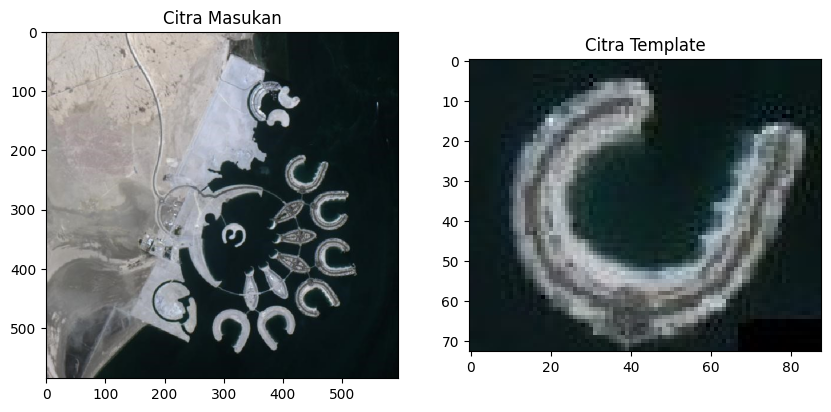

In [27]:
from PIL import Image
import matplotlib.pyplot as plt

def template_matching(image, template):
    img = Image.open(image)
    tpl = Image.open(template)

    img_width, img_height = img.size
    tpl_width, tpl_height = tpl.size

    img_data = img.load()
    tpl_data = tpl.load()

    matches = []

    for x in range(img_width - tpl_width + 1):
        for y in range(img_height - tpl_height + 1):
            match = True
            for i in range(tpl_width):
                for j in range(tpl_height):
                    if img_data[x + i, y + j] != tpl_data[i, j]:
                        match = False
                        break
                if not match:
                    break
            if match:
                matches.append((x, y))

    return matches

# Citra masukan dan citra template
image_path = '/content/drive/MyDrive/PCVK/Image/bahrain.jpg'
template_path = '/content/drive/MyDrive/PCVK/Image/bahrain-template.jpg'

matched_locations = template_matching(image_path, template_path)

# Menampilkan citra masukan dan citra template
img = Image.open(image_path)
tpl = Image.open(template_path)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(img)
ax[0].set_title('Citra Masukan')

ax[1].imshow(tpl)
ax[1].set_title('Citra Template')

# Menandai posisi objek yang cocok di citra masukan dengan grid
for match in matched_locations:
    x, y = match
    rect = plt.Rectangle((x, y), tpl.width, tpl.height, edgecolor='r', facecolor='none')
    ax[0].add_patch(rect)

    # Menambahkan grid pada posisi deteksi
    for i in range(tpl.width):
        ax[0].axvline(x + i, color='r', linestyle='--', linewidth=0.5)
    for j in range(tpl.height):
        ax[0].axhline(y + j, color='r', linestyle='--', linewidth=0.5)

plt.show()


4. Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg, sehingga menghasilkan luaran sebagai berikut:

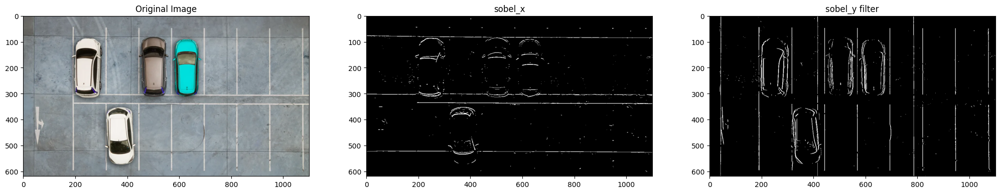

In [33]:
# 3A Sobel Edge Detection

image_ori = cv.imread('/content/drive/MyDrive/PCVK/Image/car-park.jpg', cv.IMREAD_COLOR)

# Convert image to gray scale
image_gray = cv.cvtColor(image_ori, cv.COLOR_BGR2GRAY)

# 3x3 Y-direction kernel
sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

# 3x3 X-direction kernel
sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

# Filter the image using filter2D, which has inputs: (grayscale image, bit-depth, kernel)
filtered_image_y = cv.filter2D(image_gray, -1, sobel_y)
filtered_image_x = cv.filter2D(image_gray, -1, sobel_x)

# Convert the edge-detected images to black and white
ret, thresh1 = cv.threshold(filtered_image_y, 100, 255, cv.THRESH_BINARY)
ret, thresh2 = cv.threshold(filtered_image_x, 100, 255, cv.THRESH_BINARY)

(fig, (ax1, ax2, ax3)) = plt.subplots(1, 3, figsize=(25, 25))
ax1.title.set_text('Original Image')
ax1.imshow(image_ori)
ax2.title.set_text('sobel_x')
ax2.imshow(thresh1, cmap='gray')  # Menampilkan dalam skala abu-abu (hitam putih)
ax3.title.set_text('sobel_y filter')
ax3.imshow(thresh2, cmap='gray')  # Menampilkan dalam skala abu-abu (hitam putih)

plt.show()


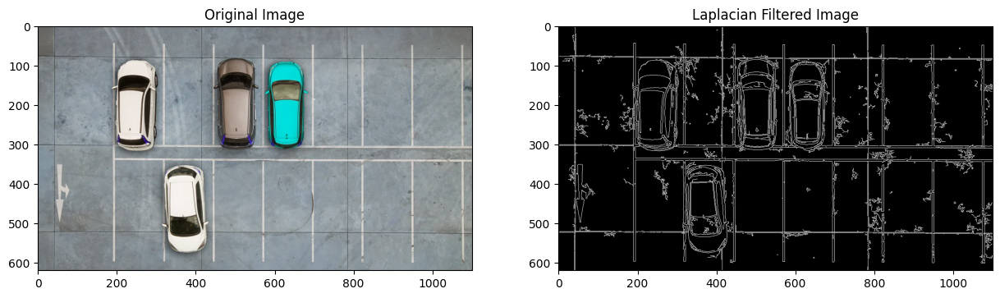

In [30]:
# 4B Canny Edge Detection

image_ori = cv.imread('/content/drive/MyDrive/PCVK/Image/car-park.jpg', cv.IMREAD_COLOR)

# remove noise
image_gray = cv.cvtColor(image_ori, cv.COLOR_BGR2GRAY)
filtered_image = cv.Canny(image_gray, threshold1=20, threshold2=200)

# plot output
(fig, (ax1, ax2)) = plt.subplots(1, 2, figsize=(15, 15))
ax1.title.set_text('Original Image')
ax1.imshow(image_ori)
ax2.title.set_text('Laplacian Filtered Image')
ax2.imshow(filtered_image, cmap='gray')

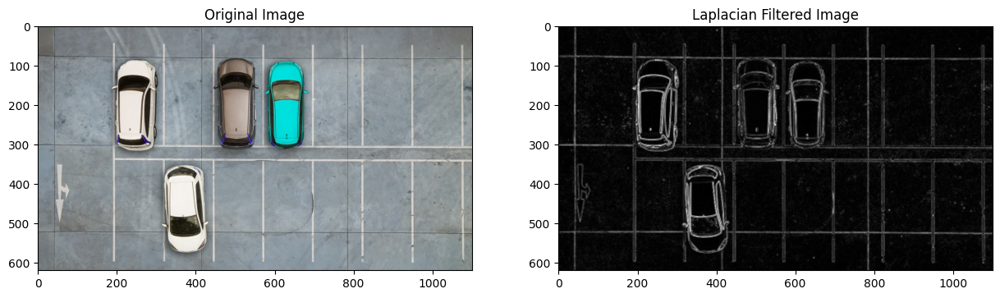

In [32]:
# 4C Laplacian Edge Detection

image_ori = cv.imread('/content/drive/MyDrive/PCVK/Image/car-park.jpg', cv.IMREAD_COLOR)

# remove noise
image_gray = cv.cvtColor(image_ori, cv.COLOR_BGR2GRAY)

# reduce noise in image
img = cv.GaussianBlur(image_gray,(3,3),0)

# filter the image using filter2D, which has inputs: (grayscale image, bit-depth, kernel)
filtered_image = cv.Laplacian(img, ksize=3, ddepth=cv.CV_16S)

# converting back to uint8
filtered_image = cv.convertScaleAbs(filtered_image)

# Plot output
(fig, (ax1, ax2)) = plt.subplots(1, 2, figsize=(15, 15))
ax1.title.set_text('Original Image')
ax1.imshow(image_ori)
ax2.title.set_text('Laplacian Filtered Image')
ax2.imshow(filtered_image, cmap='gray')

5. Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada
OpenCV dengan menggunakan gambar chess-board.jpg, sehingga menghasilkan
luaran sebagai berikut:

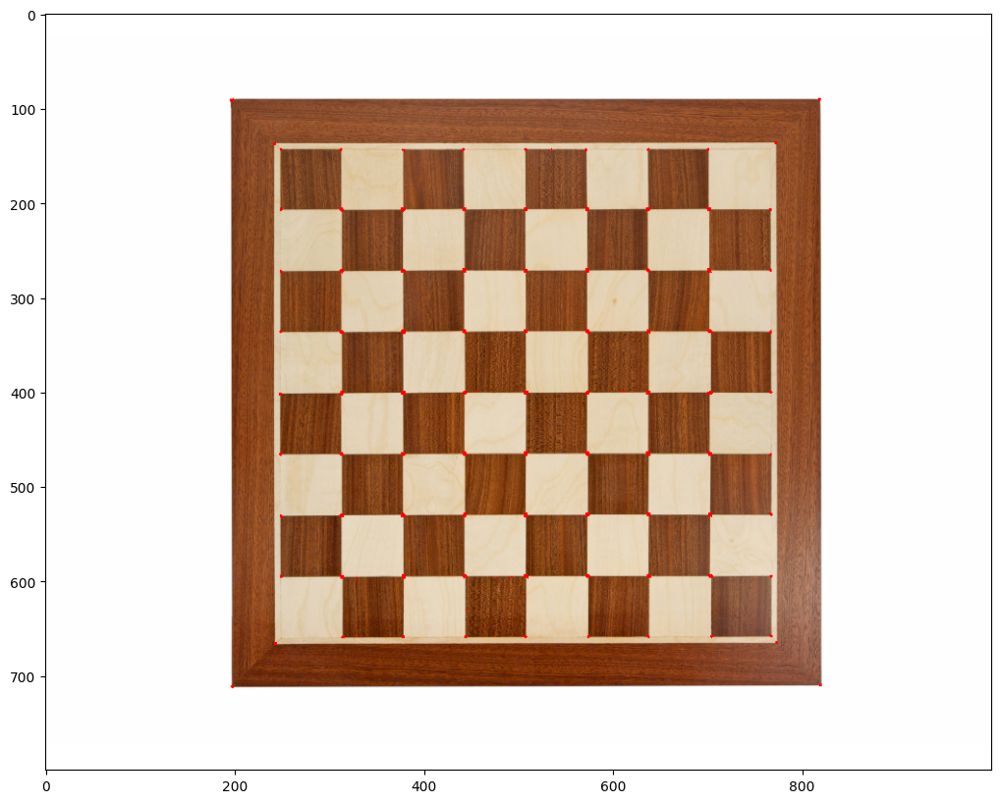

In [34]:
# 4A Harris Corner Detection

# load citra input
input_img = cv.imread('/content/drive/MyDrive/PCVK/Image/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)
dst = cv.cornerHarris(gray_img,3,1,0.04)

gray_img = np.float32(gray_img)
harris_output = cv.cornerHarris(gray_img,2,3, 3)

#hasil harris corner dilakukan dilasi untuk menandai sudut
harris_output = cv.dilate(harris_output, None)

#Threshold untuk mengoptimalkan nilai
input_img[dst>0.01*dst.max()]=[0,0,255]

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

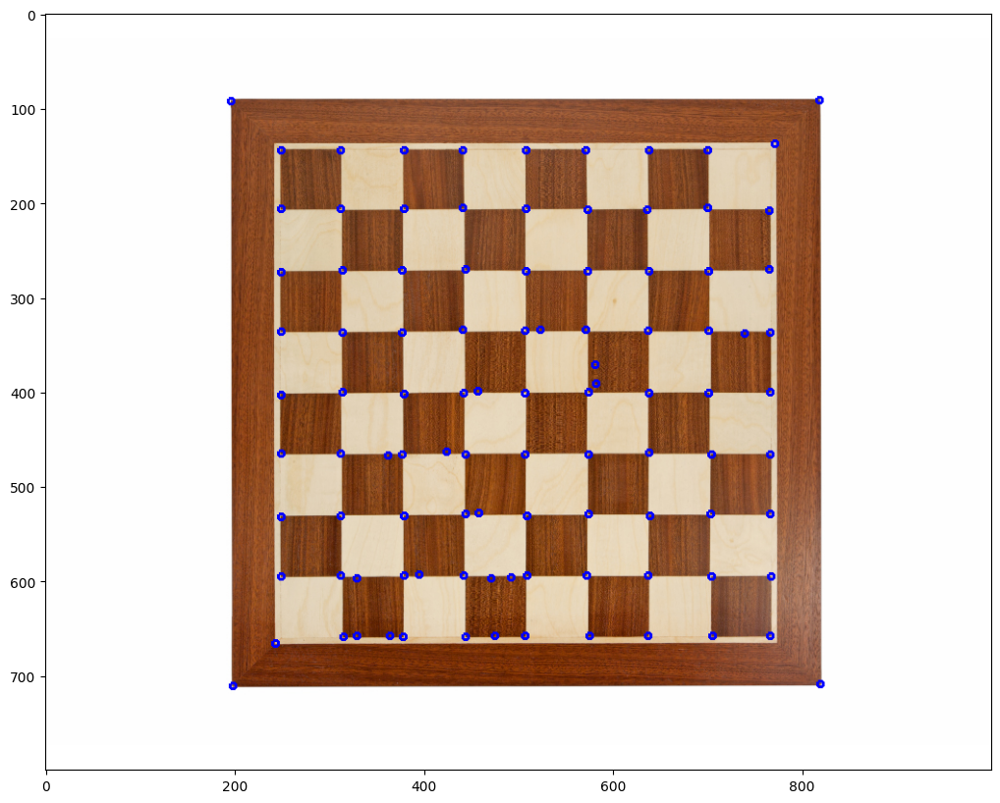

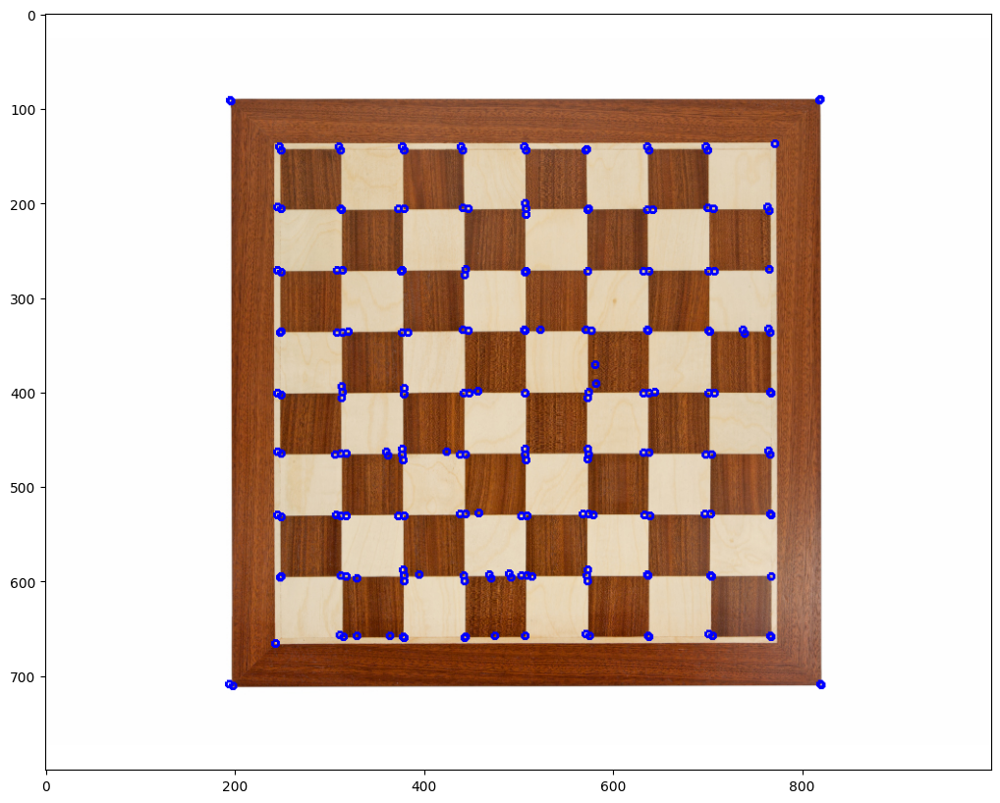

In [38]:
# 4B Shi-Tomasi Detection

input_img = cv.imread('/content/drive/MyDrive/PCVK/Image/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

corners = cv.goodFeaturesToTrack(gray_img, 100,0.01,10)
corners = np. int0(corners)
for i in corners:
    x,y = i.ravel()
    cv.circle(input_img, (x,y),3,255,2)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

corners = cv.goodFeaturesToTrack(gray_img, 100,0.01,10)
corners = np. int0(corners)
for i in corners:
    x,y = i.ravel()
    cv.circle(input_img, (x,y),3,255,2)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

6. Implementasikan metode Hough Transform pada OpenCV dengan menggunakan
gambar sudoku.jpg. Tahapan proses grid detection sesuai yang terdapat pada ulasan teori, sehingga menghasilkan luaran sebagai berikut:

number of Hough lines: 33
Number of filtered lines: 1
Number of filtered lines: 2
Number of filtered lines: 3
Number of filtered lines: 4
Number of filtered lines: 5
Number of filtered lines: 6
Number of filtered lines: 7
Number of filtered lines: 8
Number of filtered lines: 9
Number of filtered lines: 10
Number of filtered lines: 11
Number of filtered lines: 12
Number of filtered lines: 13
Number of filtered lines: 14
Number of filtered lines: 14
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 16
Number of filtered lines: 16
Number of filtered lines: 17
Number of filtered lines: 17
Number of filtered lines: 18
Number of filtered lines: 18
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20


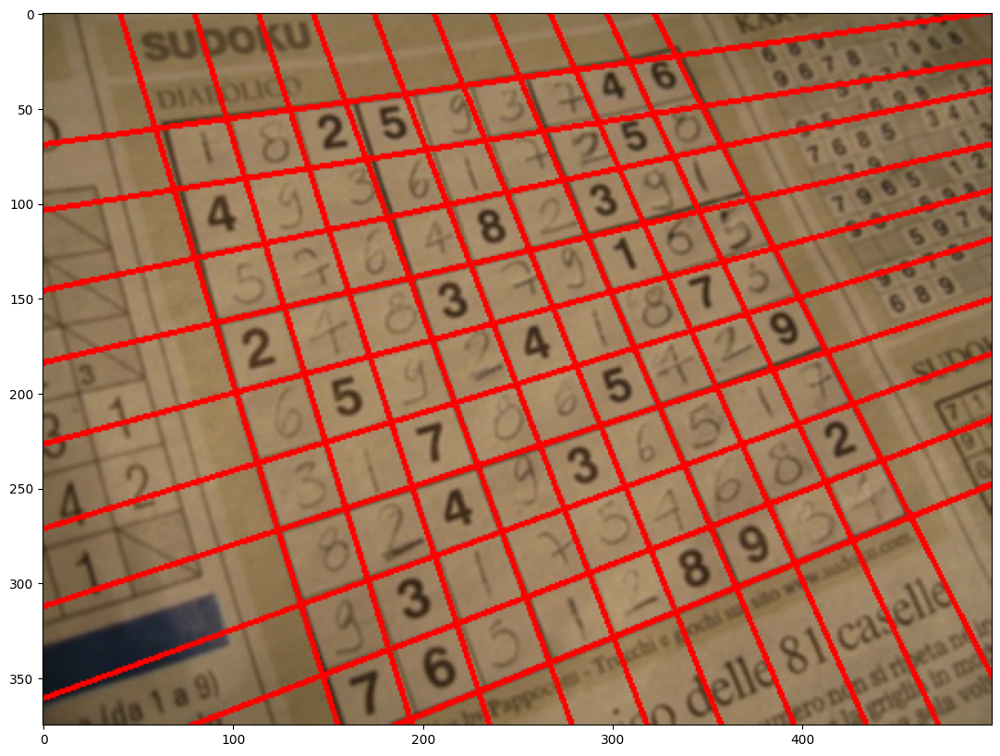

In [39]:
input_img = cv.imread('/content/drive/MyDrive/PCVK/Image/sudoku.jpg')
img_gray = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

edges = cv.Canny (img_gray, 90, 150, apertureSize = 3)

kernel = np.ones((3,3), np.uint8)
edges = cv.dilate(edges,kernel,iterations = 1)

kernel = np.ones((5,5), np.uint8)
edges = cv.erode (edges, kernel, iterations = 1)

lines = cv.HoughLines(edges,1,np.pi/180,150)


if not lines.any():
    print('No lines were found')
    exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1


    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
      for j in range (len (lines)):
        if i == j:
            continue

        rho_i, theta_i = lines[i][0]
        rho_j, theta_j = lines[j][0]
        if abs(rho_i - rho_j) < rho_threshold and abs (theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)


    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x: len(similar_lines[x]))

    line_flags = len(lines) *[True]
    for i in range(len(lines) - 1):
        if not line_flags [indices[i]]:
            continue

        for j in range(i + 1, len(lines)):
            if not line_flags[indices[j]]:
                continue
            rho_i, theta_i = lines[indices[i]][0]
            rho_j, theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags [indices[j]] = False
    print('number of Hough lines:', len(lines))

    filtered_lines = []

    if filter:
        for i in range(len(lines)):
            if line_flags[i]:
                filtered_lines.append(lines[i])

            print('Number of filtered lines:', len(filtered_lines ))
    else:
        filtered_lines = lines

    for line in filtered_lines:
        rho, theta = line [0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a*rho
        y0 = b*rho
        x1 = int(x0 + 1000*(-b))
        y1 = int(y0 + 1000*(a))
        x2 = int(x0 - 1000*(-b))
        y2 = int(y0 - 1000*(a))

        cv.line(input_img, (x1, y1), (x2,y2),(0,0,255),2)

    plt.figure(figsize=(20,10))
    plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

7. Implementasikan fungsi findContours() pada OpenCV untuk contour detection dengan
menggunakan gambar laptop.jpg, sehingga menghasilkan luaran sebagai berikut:

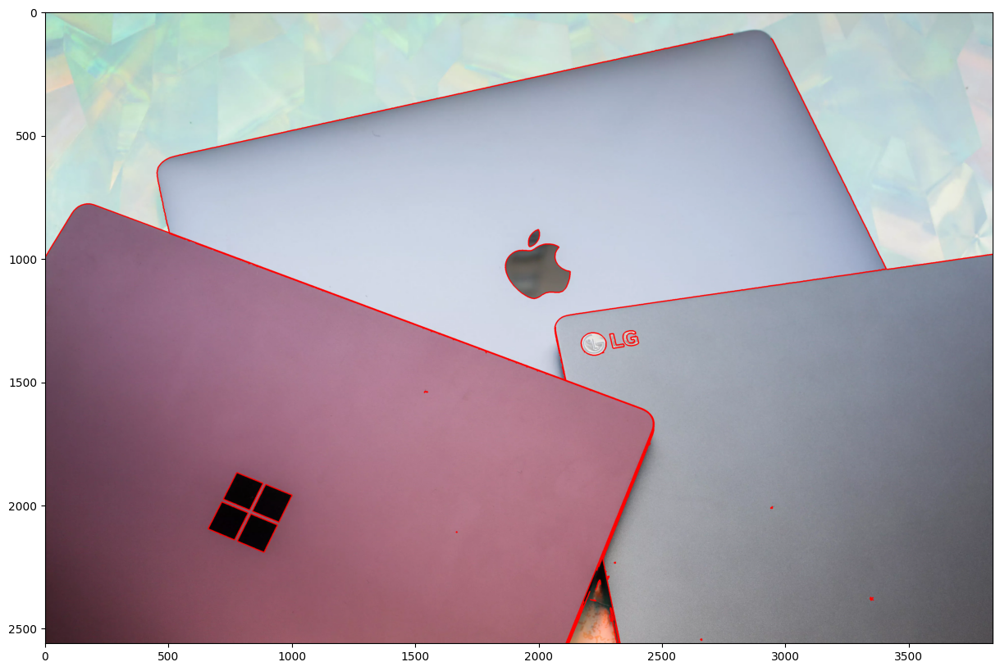

In [40]:
img = cv.imread('/content/drive/MyDrive/PCVK/Image/laptop.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

edged = cv.Canny(img_gray, 30, 200)

contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

cv.drawContours(img, contours, -1, (0,0,255), 3)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

**Pengayaan Materi KTP**

1. Siapkan file dataset,

2. Muat 2 library berikut sebagai tahapan persiapan, tetapi disini saya menggunakan cv2_imshow() dari google.colab.patches

In [53]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np

3. Tambahkan kode lokalisasi dataset dan lakukan pembacaan file name di dalam direktori dataset tersebut

In [54]:
# Membaca citra KTP
ktp_image = cv2.imread('/content/drive/MyDrive/PCVK/Image/ktp.png')

blurred = ktp_image.copy()

4. Masih pada looping file direktori, terapkan Gaussian Blur untuk setiap file supaya noise pickle dapat direduksi

In [55]:
# Filtering
for i in range(10):
    blurred = cv2.GaussianBlur(blurred, (5, 5), 0.5)

5. Lakukan konversi grayscale untuk setiap hasil citra yang tereduksi noise dan lanjutkan dengan binerisasi citra (thresholding)

161.0 (680, 1055)


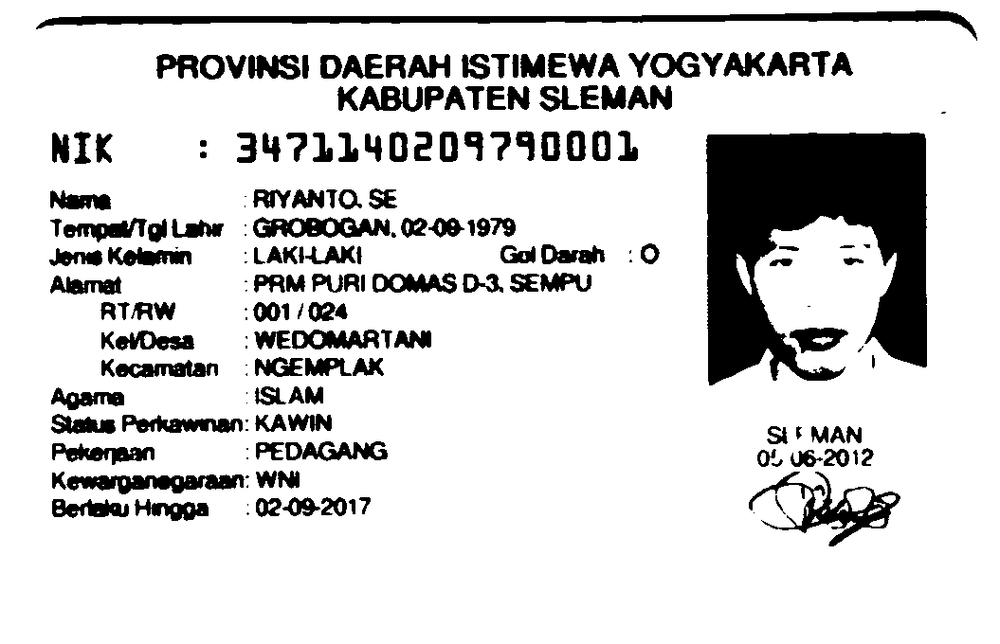

-1

In [56]:
# Konversi ke citra grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

# Thresholding
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(ret, bw.shape)

# Tampilkan hasil thresholding
cv2_imshow(bw)
cv2.waitKey(0)

6. Terapkan morfologi untuk setiap citra yang telah mengalami binerisasi supaya setiap karakter atau obyek tidak berhimpitan.

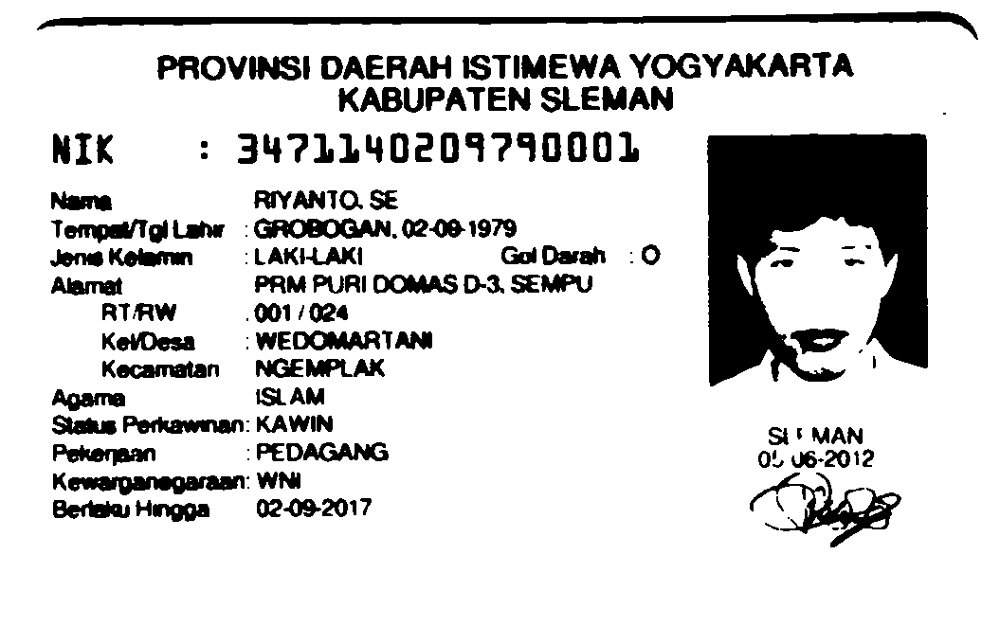

-1

In [57]:
# Morfologi
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
morph = cv2.morphologyEx(bw, cv2.MORPH_CLOSE, kernel)

# Tampilkan hasil morfologi
cv2_imshow(morph)
cv2.waitKey(0)

7. Terapkan ekstraksi kontur untuk untuk mendapatkan semua kontur setiap karakter/obyek.Kontur harus diseleksi berdasarkan ukuran dan rasio sebuah karakter. Karakter/obyek didalam KTP ini bervariasi ukuran dan rasionya, sehingga setiap karakter/obyek perlu
penanganan yang berbeda. Contoh pada praktik ini berfokus pada karakter yang seukuran dengan NIK. Jika hasil ekstraksi kontur memperlihatkan hasil lain yaitu karakter lain terdeteksi, hal tersebut wajar karena perlu optimize code dan preprocessing yang lebih baik (karena hasil akuisisi setiap citra dapat berbeda).

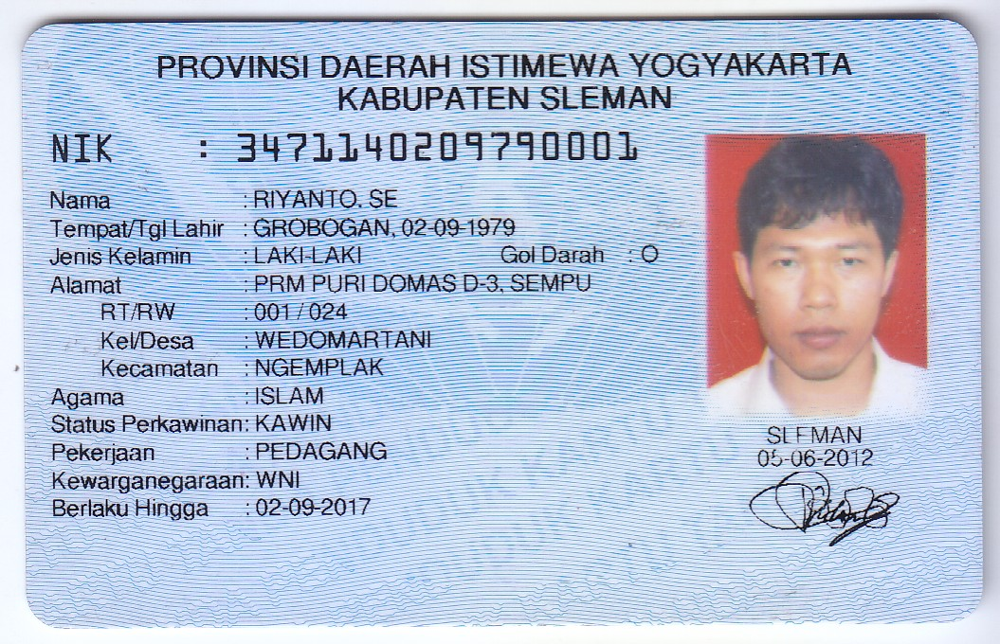

In [63]:
# Ekstraksi kontur
contours, _ = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
valid_contours = []

for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    aspect_ratio = float(w) / h

    # Seleksi kontur berdasarkan ukuran dan rasio karakter
    if (w > 50) and (h > 50) and (w < 200) and (h < 200) and (aspect_ratio > 0.5) and (aspect_ratio < 1.0):
        valid_contours.append(cnt)

contour_img = cv2.drawContours(ktp_image.copy(), valid_contours, -1, (0, 255, 0), 2)

# Tampilkan hasil ekstraksi kontur
cv2_imshow(contour_img)

**TUGAS PRAKTIKUM**

Setiap citra memiliki karakteristik yang berbeda. Terapkan praktik pada materi pengayaan KTP untuk setiap dataset KTP yang tersedia. Perhatikan kondisi awal dataset, terapkan preprocessing yang sesuai jika kualitas visual citra kurang memadai untuk segera diolah. Pengerjaan dilakukan
secara berkelompok dengan aturan sebagai berikut:

Kelompok 3 – KTP Arief Wijaya Cimahi

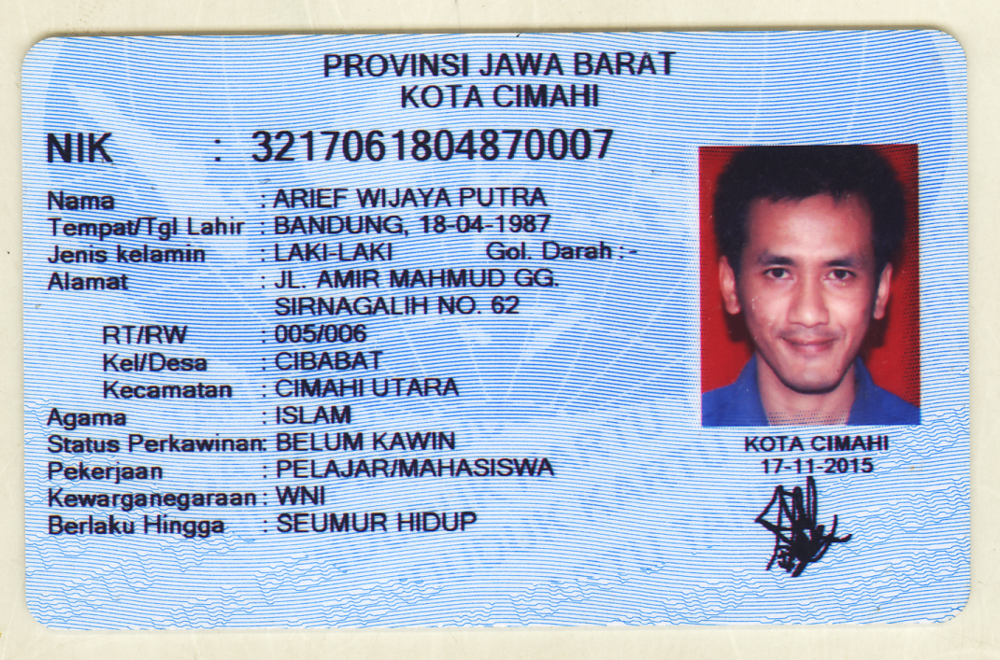

In [64]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np

# Membaca citra KTP
ktp_image = cv2.imread('/content/drive/MyDrive/KTP/KTP_More/ktp2.png')

blurred = ktp_image.copy()

# Filtering
for i in range(10):
    blurred = cv2.GaussianBlur(blurred, (5, 5), 0.5)

# Konversi ke citra grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

# Thresholding
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Morfologi
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
morph = cv2.morphologyEx(bw, cv2.MORPH_CLOSE, kernel)

# Ekstraksi kontur
contours, _ = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
valid_contours = []

for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    aspect_ratio = float(w) / h

    # Seleksi kontur berdasarkan ukuran dan rasio karakter
    if (w > 50) and (h > 50) and (w < 200) and (h < 200) and (aspect_ratio > 0.5) and (aspect_ratio < 1.0):
        valid_contours.append(cnt)

contour_img = cv2.drawContours(ktp_image.copy(), valid_contours, -1, (0, 255, 0), 2)

# Tampilkan hasil ekstraksi kontur
cv2_imshow(contour_img)